# CE-UY 3013 Computing in Civil Engineering [Fall 2020]

## Visualizations

Last updated: Sun Nov 02 2020

In [1]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import matplotlib.tri as tri
from matplotlib.patches import Polygon

# plots inline
%matplotlib inline

# optional: High-Res Plots
%config InlineBackend.figure_formats = ['svg']

Simple plots:

In [2]:
x = np.linspace(0, 5, 11)
y = x ** 3

print(x)
print(y)

[0.  0.5 1.  1.5 2.  2.5 3.  3.5 4.  4.5 5. ]
[  0.      0.125   1.      3.375   8.     15.625  27.     42.875  64.
  91.125 125.   ]


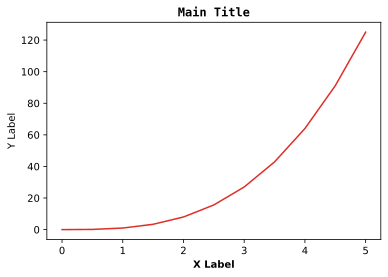

In [3]:
plt.plot(x, y, color='#de2d26')

plt.title('Main Title', fontweight='black', fontfamily='monospace')
plt.xlabel('X Label', fontweight='bold')
plt.ylabel('Y Label')

plt.show()

Subplots (w/out defining a figure):

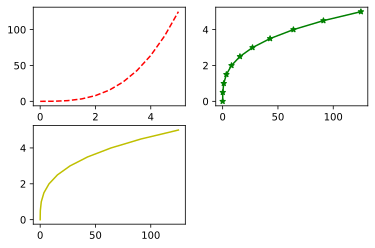

In [4]:
plt.subplot(2, 2, 1)  # nrow, ncol, plot number
plt.plot(x, y, 'r--')

plt.subplot(2, 2, 2)
plt.plot(y, x, 'g*-')


plt.subplot(2, 2, 3)
plt.plot(y, x, 'y-')

plt.show()

Let's start working with figures:

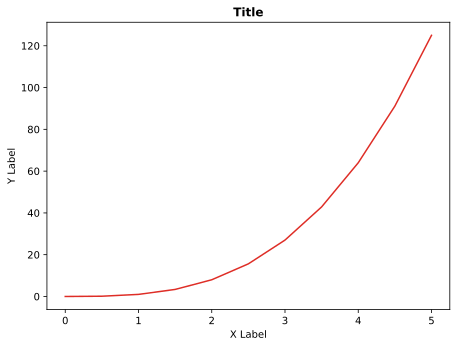

In [5]:
fig = plt.figure(figsize=(7, 5))

ax = fig.add_axes([0.1, 0.1, 0.8, 0.8]) # left, bottom, width, height (0 to 1)

ax.plot(x, y, color='#de2d26')
ax.set_title('Title', weight='bold')
ax.set_xlabel('X Label')
ax.set_ylabel('Y Label')

plt.show()

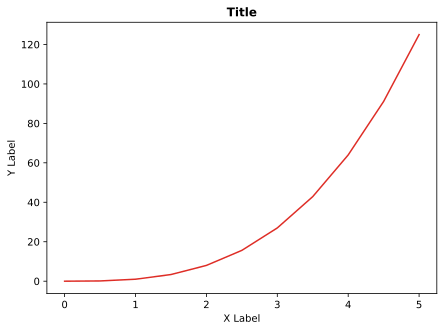

In [6]:
# Same as above but without the `add_axes`

fig, ax = plt.subplots(figsize=(7, 5))

ax.plot(x, y, color='#de2d26')
ax.set_title('Title', weight='bold')
ax.set_xlabel('X Label')
ax.set_ylabel('Y Label')

plt.show()

Better subplots:

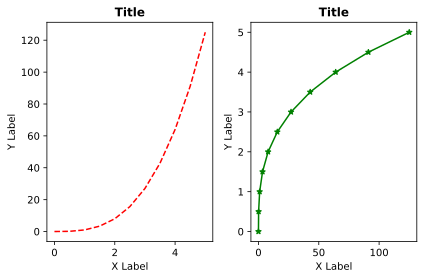

In [7]:
fig, ax = plt.subplots(nrows=1, ncols=2)

ax[0].plot(x, y, 'r--')
ax[0].set_title('Title', weight='bold')
ax[0].set_xlabel('X Label')
ax[0].set_ylabel('Y Label')


ax[1].plot(y, x, 'g*-')
ax[1].set_title('Title', weight='bold')
ax[1].set_xlabel('X Label')
ax[1].set_ylabel('Y Label')

plt.tight_layout()
plt.show()

Plot within a plot:

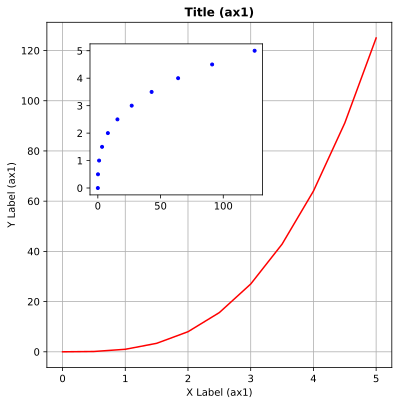

In [8]:
fig = plt.figure(figsize=(6, 6))

ax1 = fig.add_axes([0.1, 0.1, 0.8, 0.8]) # main plot
ax2 = fig.add_axes([0.2, 0.5, 0.4, 0.35]) # secondary plot

# main plot
ax1.plot(x, y, 'r')
ax1.set_title('Title (ax1)', weight='bold')
ax1.set_xlabel('X Label (ax1)')
ax1.set_ylabel('Y Label (ax1)')
ax1.grid()

# secondary plot
ax2.plot(y, x, 'b.')

plt.savefig('demo_plot.png')
plt.show()

Adding legend:

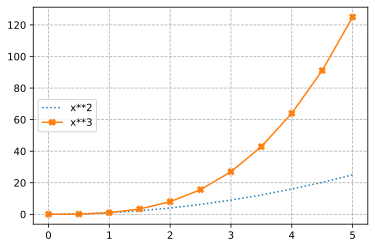

In [9]:
fig, ax = plt.subplots()

ax.plot(x, x**2, label='x**2', linestyle=':')

ax.plot(x, x**3, label='x**3', marker='X')

ax.legend(loc='center left')

ax.grid(ls='--')

plt.show()

# Contour Plots

https://data.cityofnewyork.us/Transportation/Elevation-points/szwg-xci6

Working with the CSV file:

In [11]:
df = pd.read_csv('data/nyc_elevations.csv')

In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1473788 entries, 0 to 1473787
Data columns (total 6 columns):
 #   Column     Non-Null Count    Dtype  
---  ------     --------------    -----  
 0   FEAT_CODE  1473788 non-null  int64  
 1   ELEVATION  1473788 non-null  float64
 2   the_geom   1473788 non-null  object 
 3   SOURCE_ID  1473788 non-null  int64  
 4   SUB_CODE   1473788 non-null  int64  
 5   STATUS     1473788 non-null  object 
dtypes: float64(1), int64(3), object(2)
memory usage: 67.5+ MB


In [13]:
df.head()

,FEAT_CODE,ELEVATION,the_geom,SOURCE_ID,SUB_CODE,STATUS
0,3020,129.740000,POINT (-73.98256951739029 40.70191431011495),21302000001,302000,Unchanged
1,3000,120.586263,POINT (-73.98777990215136 40.70192587201795),21300000002,300020,Unchanged
2,3020,114.740000,POINT (-73.9844362285535 40.70193746867856),21302000003,302000,Unchanged
3,3020,69.130000,POINT (-73.98103106115082 40.70194154237234),21302000004,302000,Unchanged
4,3020,49.235397,POINT (-73.98802335685477 40.70196086988672),21302000005,302000,Unchanged


We must extract the coordinates from the ``the_geom`` column.

In [14]:
ss = 'POINT (-73.98256951739029 40.70191431011495)'

import re

print(re.findall('\(([^)]+)', ss)[0].split(' '))

['-73.98256951739029', '40.70191431011495']


In [15]:
df['lat_long'] = df['the_geom'].str.extract('\(([^)]+)')
df[['lat', 'long']] = df['lat_long'].str.split(' ', expand=True)
df['lat'] = pd.to_numeric(df['lat'])
df['long'] = pd.to_numeric(df['long'])

In [16]:
df.head()

,FEAT_CODE,ELEVATION,the_geom,SOURCE_ID,SUB_CODE,STATUS,lat_long,lat,long
0,3020,129.740000,POINT (-73.98256951739029 40.70191431011495),21302000001,302000,Unchanged,-73.98256951739029 40.70191431011495,-73.982570,40.701914
1,3000,120.586263,POINT (-73.98777990215136 40.70192587201795),21300000002,300020,Unchanged,-73.98777990215136 40.70192587201795,-73.987780,40.701926
2,3020,114.740000,POINT (-73.9844362285535 40.70193746867856),21302000003,302000,Unchanged,-73.9844362285535 40.70193746867856,-73.984436,40.701937
3,3020,69.130000,POINT (-73.98103106115082 40.70194154237234),21302000004,302000,Unchanged,-73.98103106115082 40.70194154237234,-73.981031,40.701942
4,3020,49.235397,POINT (-73.98802335685477 40.70196086988672),21302000005,302000,Unchanged,-73.98802335685477 40.70196086988672,-73.988023,40.701961


In [17]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1473788 entries, 0 to 1473787
Data columns (total 9 columns):
 #   Column     Non-Null Count    Dtype  
---  ------     --------------    -----  
 0   FEAT_CODE  1473788 non-null  int64  
 1   ELEVATION  1473788 non-null  float64
 2   the_geom   1473788 non-null  object 
 3   SOURCE_ID  1473788 non-null  int64  
 4   SUB_CODE   1473788 non-null  int64  
 5   STATUS     1473788 non-null  object 
 6   lat_long   1473788 non-null  object 
 7   lat        1473788 non-null  float64
 8   long       1473788 non-null  float64
dtypes: float64(3), int64(3), object(3)
memory usage: 101.2+ MB


All set. However, the file is quite large, let's work with a random sample of 200 points

In [18]:
df_small = df[['lat', 'long', 'ELEVATION']].sample(n=200)
df_small.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 200 entries, 657306 to 1392071
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   lat        200 non-null    float64
 1   long       200 non-null    float64
 2   ELEVATION  200 non-null    float64
dtypes: float64(3)
memory usage: 6.2 KB


In [19]:
df_small.head()

,lat,long,ELEVATION
657306,-73.993083,40.765108,89.680000
497062,-73.904548,40.741703,47.980000
289972,-73.738280,40.724441,92.100000
24436,-73.768888,40.595628,31.807336
754143,-73.856663,40.815149,14.429832


Contour plot of the 200 points:

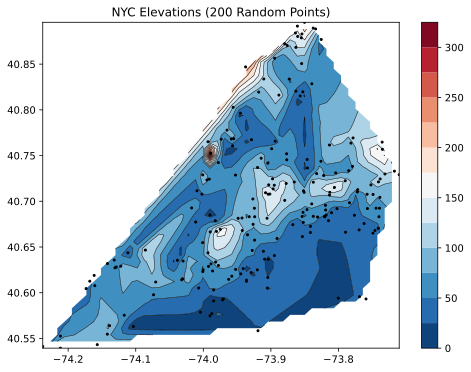

In [20]:
x, y = df_small['lat'], df_small['long']
z = df_small['ELEVATION']

# Create grid values
xi = np.linspace(min(x), max(x))
yi = np.linspace(min(y), max(y))

# Perform linear interpolation of the data (x,y)
# on a grid defined by (xi,yi)
triang = tri.Triangulation(x, y)
interpolator = tri.LinearTriInterpolator(triang, z)
Xi, Yi = np.meshgrid(xi, yi)
zi = interpolator(Xi, Yi)

fig, ax = plt.subplots(figsize=(8,6))

ax.contour(xi, yi, zi, levels=14, linewidths=0.5, colors='k')
cntr = ax.contourf(xi, yi, zi, levels=14, cmap="RdBu_r")

fig.colorbar(cntr, ax=ax)
ax.plot(x, y, 'ko', ms=2)
ax.set_title('NYC Elevations (200 Random Points)')

plt.show()

Contour plot of all points (will take a few minutes to run):

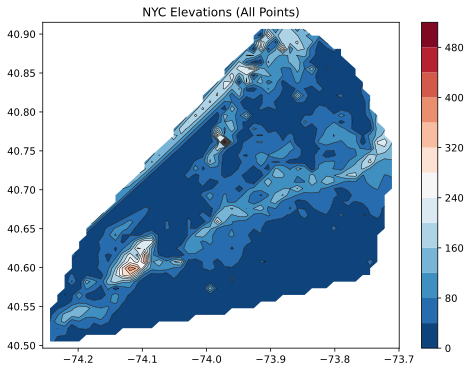

In [ ]:
x, y = df['lat'], df['long']
z = df['ELEVATION']

# Create grid values
xi = np.linspace(min(x), max(x))
yi = np.linspace(min(y), max(y))

# Perform linear interpolation of the data (x,y)
# on a grid defined by (xi,yi)
triang = tri.Triangulation(x, y)
interpolator = tri.LinearTriInterpolator(triang, z)
Xi, Yi = np.meshgrid(xi, yi)
zi = interpolator(Xi, Yi)

fig, ax = plt.subplots(figsize=(8,6))

ax.contour(xi, yi, zi, levels=14, linewidths=0.5, colors='k')
cntr = ax.contourf(xi, yi, zi, levels=14, cmap="RdBu_r")

fig.colorbar(cntr, ax=ax)
# ax.plot(x, y, 'ko', ms=2)
ax.set_title('NYC Elevations (All Points)')

plt.show()

Let's make this a bit better with borough boundaries. Data from https://data.cityofnewyork.us/City-Government/Borough-Boundaries/tqmj-j8zm

In [21]:
df_bound = pd.read_csv('nybb.csv')

In [22]:
df_bound.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5 entries, 0 to 4
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   BoroCode    5 non-null      int64  
 1   BoroName    5 non-null      object 
 2   Shape_Leng  5 non-null      float64
 3   the_geom    5 non-null      object 
 4   Shape_Area  5 non-null      float64
dtypes: float64(2), int64(1), object(2)
memory usage: 328.0+ bytes


In [23]:
df_bound

,BoroCode,BoroName,Shape_Leng,the_geom,Shape_Area
0,2,Bronx,462958.559564,MULTIPOLYGON (((-73.89680883223774 40.79580844...,1.186613e+09
1,5,Staten Island,325956.009000,MULTIPOLYGON (((-74.05050806403247 40.56642203...,1.623757e+09
2,1,Manhattan,361212.477841,MULTIPOLYGON (((-74.01092841268031 40.68449147...,6.366027e+08
3,3,Brooklyn,729593.057284,MULTIPOLYGON (((-73.86706149472118 40.58208797...,1.934091e+09
4,4,Queens,899490.723339,MULTIPOLYGON (((-73.8264466151686 40.590527442...,3.044042e+09


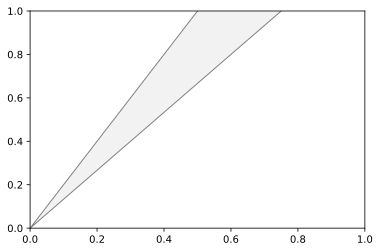

In [26]:
fig, ax = plt.subplots()

poly = Polygon([(1,2), (3,4), (0,0)], facecolor='0.95', edgecolor='0.5')
ax.add_patch(poly)
plt.show()

In [27]:
polygons = []

raw_verts = df_bound['the_geom'].str.extract('\((.+)\)')[0]

for i in range(len(raw_verts)):
    borough_verts = []
    plgns = raw_verts[i].split('((')
    for ii in range(1, len(plgns)):
        raw_points = plgns[ii].split('))')[0].split(',')
        plgn = [(float(iii.lstrip().split(' ')[0]), 
                 float(iii.lstrip().split(' ')[1])) for iii in raw_points]
        borough_verts.append(plgn)
    polygons.append(borough_verts)

fig, ax = plt.subplots()

for bor in polygons:
    for verts in bor:
        poly = Polygon(verts, facecolor='0.95', edgecolor='0.5')
        ax.add_patch(poly)

ax.set_ylim(40.50, 40.90)
ax.set_xlim(-74.3, -73.7)
plt.show()

In [28]:
x, y = df_small['lat'], df_small['long']
z = df_small['ELEVATION']

# Create grid values
xi = np.linspace(min(x), max(x))
yi = np.linspace(min(y), max(y))

# Perform linear interpolation of the data (x,y)
# on a grid defined by (xi,yi)
triang = tri.Triangulation(x, y)
interpolator = tri.LinearTriInterpolator(triang, z)
Xi, Yi = np.meshgrid(xi, yi)
zi = interpolator(Xi, Yi)

fig, ax = plt.subplots(figsize=(8,6))

ax.contour(xi, yi, zi, levels=14, linewidths=0.5, colors='k')
cntr = ax.contourf(xi, yi, zi, levels=14, cmap="RdBu_r")

fig.colorbar(cntr, ax=ax)
ax.plot(x, y, 'ko', ms=2)
ax.set_title('NYC Elevations (200 Random Points)')

for bor in polygons:
    for verts in bor:
        poly = Polygon(verts, facecolor='none', edgecolor='m')
        ax.add_patch(poly)

plt.show()

In [ ]:
x, y = df['lat'], df['long']
z = df['ELEVATION']

# Create grid values
xi = np.linspace(min(x), max(x))
yi = np.linspace(min(y), max(y))

# Perform linear interpolation of the data (x,y)
# on a grid defined by (xi,yi)
triang = tri.Triangulation(x, y)
interpolator = tri.LinearTriInterpolator(triang, z)
Xi, Yi = np.meshgrid(xi, yi)
zi = interpolator(Xi, Yi)

fig, ax = plt.subplots(figsize=(8,6))

ax.contour(xi, yi, zi, levels=14, linewidths=0.5, colors='k')
cntr = ax.contourf(xi, yi, zi, levels=14, cmap="RdBu_r")

fig.colorbar(cntr, ax=ax)
# ax.plot(x, y, 'ko', ms=2)
ax.set_title('NYC Elevations (All Points)')

for bor in polygons:
    for verts in bor:
        poly = Polygon(verts, facecolor='none', edgecolor='m')
        ax.add_patch(poly)

plt.show()